# First visualization of EEG data
This notebook is the first one in the series of EEG-training. We will learn here the basics of data visualization on Python using the MNE toolbox. Make sure you have checked the corresponding course __I. Neural bases__ in the course materials so you understand where the signals come from and what they look like.

In [12]:
import mne
import matplotlib.pyplot as plt
import numpy as np
%matplotlib notebook

Channels marked as bad: none
Channels marked as bad: none


## Import EEG data into Python
The first step is to import data. Depending on the file format that we have, we may want to use different functions, which are all of the form `mne.io.read_raw_[file type]`, where file type is either the extension or the type of data we are dealing with. In our case we have a brainvision format type of file, with a .vhdr extension: the file type is "brainvision". Set the preload parameter to True. Store the EEG data in a eegdata variable.

In [2]:
datapath = "D:/PhD/EEG data/face is left button_instructions/participant 115/115_bloc_1.vhdr"
eegdata = mne.io.read_raw_brainvision(datapath,preload=True)

Extracting parameters from D:/PhD/EEG data/face is left button_instructions/participant 115/115_bloc_1.vhdr...
Setting channel info structure...
Reading 0 ... 350839  =      0.000 ...   350.839 secs...


Take a look at the data struct (eegdata.get_data()): what does it look like? 

your notes: 

### Look into the data for a first inspection
It is important to look at the raw data to assess the data quality and judge best what preprocessing we want to apply to it later on (considering the scientific question we want to answer in addition to that). Having raw data, the easiest is to simply visualize the time series, using simply eegdata.plot().

<IPython.core.display.Javascript object>


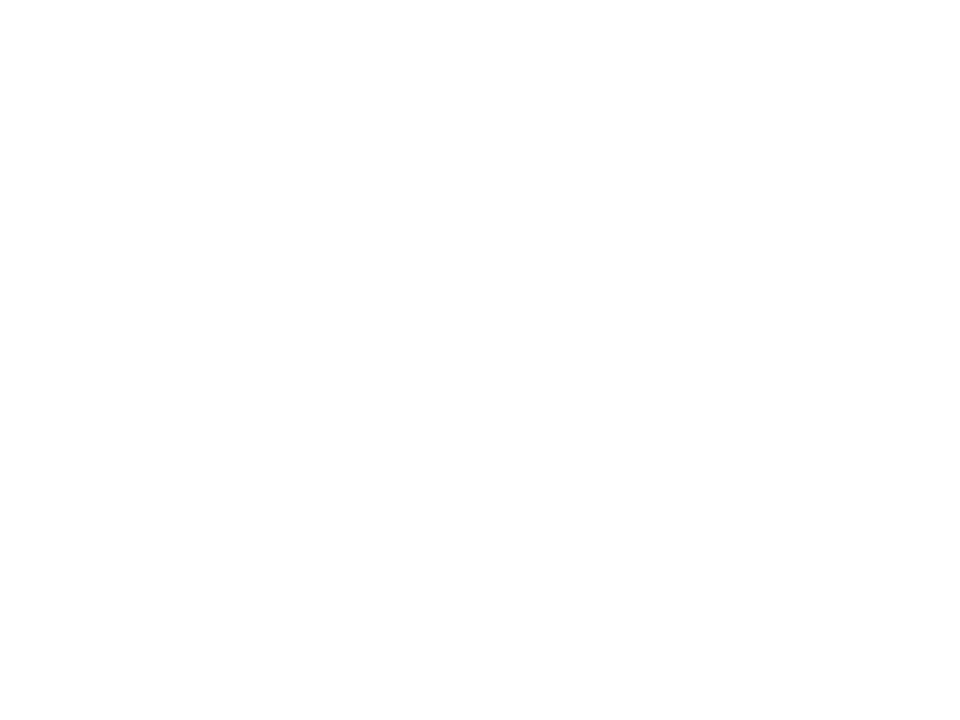

<IPython.core.display.Javascript object>


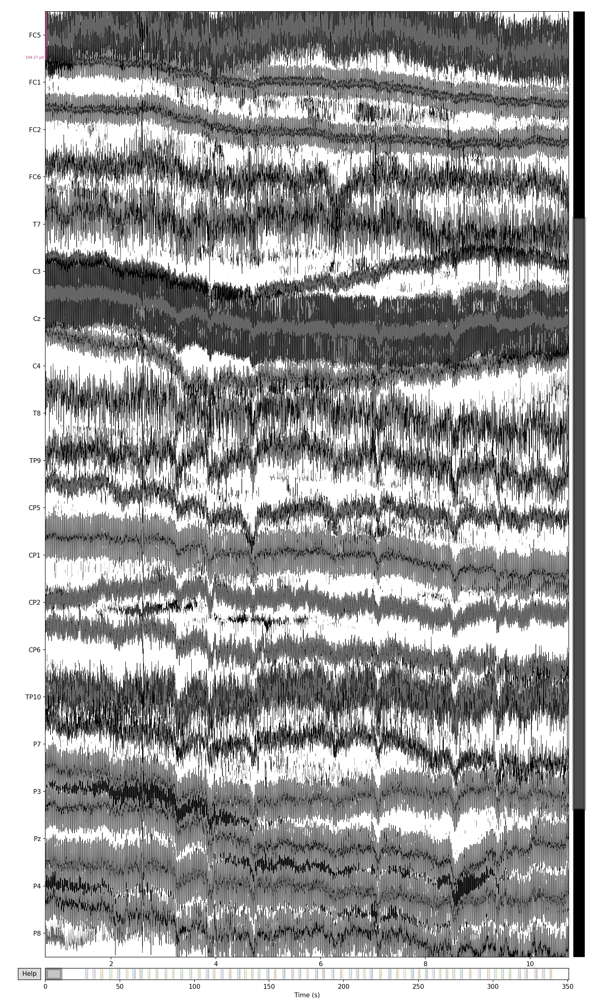

<IPython.core.display.Javascript object>


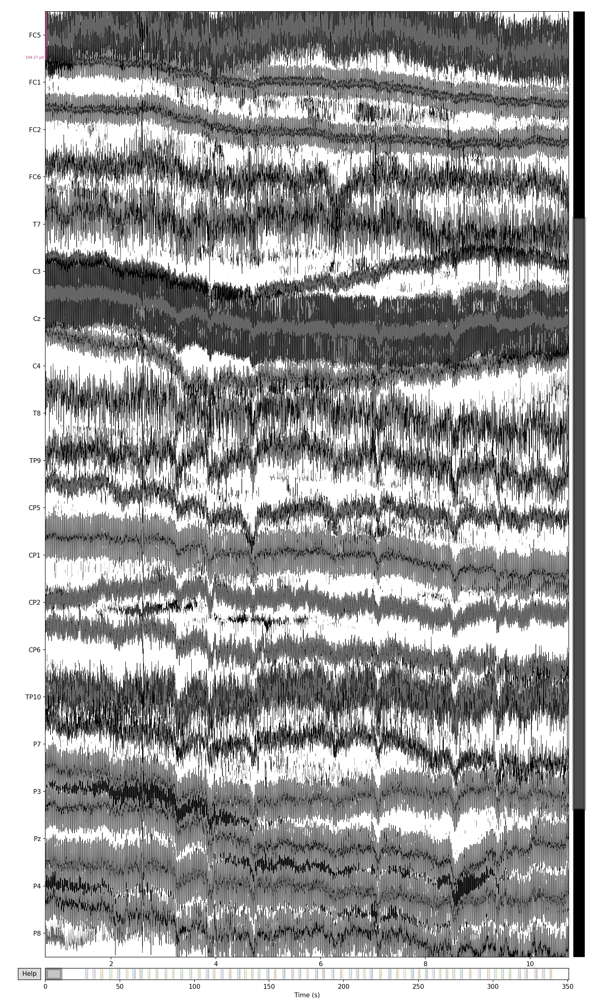

In [3]:
plt.figure()
eegdata.plot(block=True,scalings='auto')

Identify different types of artifacts in the EEG data. Are there some channels that are more prone to noise?

your answer: 

You can also have a look at the PSD. This is the spectrum of the activity of all channels combined. You obtain it through the line eegdata.plot_psd().

<IPython.core.display.Javascript object>


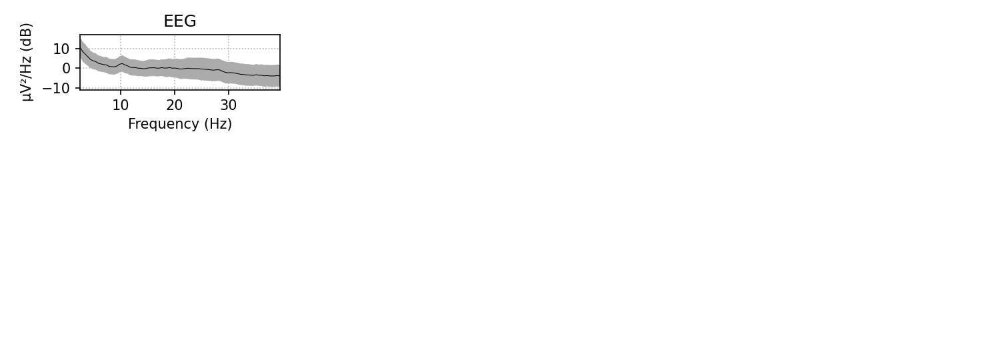

Effective window size : 2.048 (s)


<IPython.core.display.Javascript object>


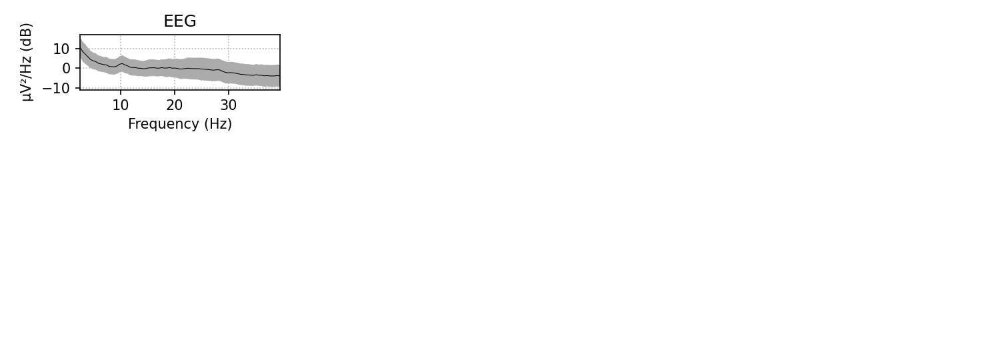

In [6]:
eegdata.plot_psd(fmin=2., fmax=40., average=True, spatial_colors=False)

What features of the spectrum do you notice on this plot?

your answer: the power generally decreases with frequency, with a small peak at  around 10Hz.

## Epoching the data
In behavioral experiments, we usually observe the link between an element in the paradigm and the resulting brain activity. While recording the data, some time stamps are placed to store the moments at which experiment events ocurred. These stamps are called __markers__, and you may already have noticed them while visualizing the full time series: they are represented by vertical lines, with a label on top. 

In the current data, there are several types of markers:
- these that indicate when the trial starts
- these that indicate when the baseline period starts
- these that indicate when the stimulus is displayed
- these that mark the time of the participant's motor response

Meaningful interpretation of neural data relies on the appropriate alignment of data. That is if we want to uncover a phenomenon that ocurrs say after a visual stimulus is displayed, it can be relevant to identify a temporal pattern that ocurrs systematically after the visual stimulus is presented. Hence, we want to compare segments of recordings which reflect the same behavior systematically, and we do that by cutting bits of equal size from data, from the same distance to a chosen marker. These recording segments are called __epochs__, and the "slicing" process is called __epoching__.

To see if you understood the use of epoching, try answering these questions:
1. If I want to observe the neural correlates of motion in the current data, on which markers should I align the epochs?
2. If I want to observe the sensory encoding (that is, the brain's response to the sensory stimulus that is provided), which markers should I use?

your answers: 1. align on the markers of the motor response
 2. align on the markers of the stimulus

In reality, it is common practise (for reasons that will become clearer in the next tutorial of this series) to extract epochs starting a small period of time before the marker. To explain shortly before we cover it in more detail later, this will allow to compute a change of activity compared to a state where we assume the brain is not performing any sort of task (this is sometimes called the __resting state__, and more accurately, we call this duration the __baseline__). The baseline usually lasts a few hundred milliseconds.

After the marker, when should you cut the data? That depends on the phenomenon you want to extract. You probably have asumptions about when your pattern should occur, based on neurophysiology or psychology. It is usually best to not extract epochs that are too short because you may be getting rid of relevant data, but not too long either in order to avoid overlapping epochs.

In the next cell, extract a list of markers corresponding to the stimulus (with `mne.events_from_annotations(eegdata)`). These markers are `10` and `20`. Then, try to extract epochs between 1 second before the markers "stimulus" (be careful, there are two different ones) and 3 seconds after these markers. Your epochs should therefore be 4 seconds long. Store your epochs in a variable called `ep`. 

In [14]:
event_id=[10,20]

events, event_dict = mne.events_from_annotations(eegdata)
evt_ix=np.where(events[:,2]==event_id[0])
for ix in range(1,len(event_id)):
    evt_ix=np.hstack((evt_ix, np.where(events[:,2]==event_id[ix])))
stim_events=np.squeeze(events[evt_ix])
stim_events=np.sort(stim_events.view('int,int,int'), order=['f1'], axis=0).view(np.int)


ep=mne.Epochs(eegdata, stim_events, event_id, tmin=- 0.2, tmax=0.5, baseline=None, preload=True)

Used Annotations descriptions: ['Comment/actiCAP Data On', 'New Segment/', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 33', 'Stimulus/S 43', 'Stimulus/S 53', 'Stimulus/S110', 'Stimulus/S111', 'Stimulus/S120', 'Stimulus/S121', 'Stimulus/S124']
Not setting metadata
Not setting metadata
60 matching events found
No baseline correction applied
0 projection items activated
Loading data for 60 events and 701 original time points ...
0 bad epochs dropped


Observe what the `ep` variable tooks like (its type, its content). What is different from the raw data (ie without epoching)? What is identical? 

Try changing the durations and markers for the epoching. What changes?

your answer: the shape of the data array changes. With too long epochs we obtain overlapping epochs.

You now have completed the basic visualization of EEG data! It seems very abstract now, but you'll soon be able to see great features. For now you have seen that the data is full of noise. In the next two tutorials, we will see how to get rid of a good part of it.